<a href="https://colab.research.google.com/github/Parimal6677/Global-Terrorism-Analysis/blob/main/EDA_Capstone_Project_Collab_Notebook_on_Global_Terrorism_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## <b> The Global Terrorism Database (GTD) is an open-source database including information on terrorist attacks around the world from 1970 through 2017. The GTD includes systematic data on domestic as well as international terrorist incidents that have occurred during this time period and now includes more than 180,000 attacks. The database is maintained by researchers at the National Consortium for the Study of Terrorism and Responses to Terrorism (START), headquartered at the University of Maryland.</b>

# <b> Explore and analyze the data to discover key findings pertaining to terrorist activities. </b>

Importing Dataset and library


In [96]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
%matplotlib inline
import math
from wordcloud import WordCloud


In [97]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [98]:
gta = pd.read_csv("/content/drive/MyDrive/terrorism analysis/Global Terrorism Data.csv" , encoding = 'ISO-8859-1')

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:3326: DtypeWarning:

Columns (4,6,31,33,61,62,63,76,79,90,92,94,96,114,115,121) have mixed types.Specify dtype option on import or set low_memory=False.



**Understanding of Data**

**Basic checks**

In [99]:
gta.head()

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
4,197001000003,1970,1,0,NaN,0,NaN,101,Japan,4,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN


In [100]:
gta.shape

(181691, 135)

In [101]:
list(gta.columns)

['eventid',
 'iyear',
 'imonth',
 'iday',
 'approxdate',
 'extended',
 'resolution',
 'country',
 'country_txt',
 'region',
 'region_txt',
 'provstate',
 'city',
 'latitude',
 'longitude',
 'specificity',
 'vicinity',
 'location',
 'summary',
 'crit1',
 'crit2',
 'crit3',
 'doubtterr',
 'alternative',
 'alternative_txt',
 'multiple',
 'success',
 'suicide',
 'attacktype1',
 'attacktype1_txt',
 'attacktype2',
 'attacktype2_txt',
 'attacktype3',
 'attacktype3_txt',
 'targtype1',
 'targtype1_txt',
 'targsubtype1',
 'targsubtype1_txt',
 'corp1',
 'target1',
 'natlty1',
 'natlty1_txt',
 'targtype2',
 'targtype2_txt',
 'targsubtype2',
 'targsubtype2_txt',
 'corp2',
 'target2',
 'natlty2',
 'natlty2_txt',
 'targtype3',
 'targtype3_txt',
 'targsubtype3',
 'targsubtype3_txt',
 'corp3',
 'target3',
 'natlty3',
 'natlty3_txt',
 'gname',
 'gsubname',
 'gname2',
 'gsubname2',
 'gname3',
 'gsubname3',
 'motive',
 'guncertain1',
 'guncertain2',
 'guncertain3',
 'individual',
 'nperps',
 'nperpcap',
 

In [102]:
gta.describe()

,eventid,iyear,imonth,iday,extended,country,region,latitude,longitude,specificity,...,ransomamt,ransomamtus,ransompaid,ransompaidus,hostkidoutcome,nreleased,INT_LOG,INT_IDEO,INT_MISC,INT_ANY
count,1.816910e+05,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,177135.000000,1.771340e+05,181685.000000,...,1.350000e+03,5.630000e+02,7.740000e+02,552.000000,10991.000000,10400.000000,181691.000000,181691.000000,181691.000000,181691.000000
mean,2.002705e+11,2002.638997,6.467277,15.505644,0.045346,131.968501,7.160938,23.498343,-4.586957e+02,1.451452,...,3.172530e+06,5.784865e+05,7.179437e+05,240.378623,4.629242,-29.018269,-4.543731,-4.464398,0.090010,-3.945952
std,1.325957e+09,13.259430,3.388303,8.814045,0.208063,112.414535,2.933408,18.569242,2.047790e+05,0.995430,...,3.021157e+07,7.077924e+06,1.014392e+07,2940.967293,2.035360,65.720119,4.543547,4.637152,0.568457,4.691325
min,1.970000e+11,1970.000000,0.000000,0.000000,0.000000,4.000000,1.000000,-53.154613,-8.618590e+07,1.000000,...,-9.900000e+01,-9.900000e+01,-9.900000e+01,-99.000000,1.000000,-99.000000,-9.000000,-9.000000,-9.000000,-9.000000
25%,1.991021e+11,1991.000000,4.000000,8.000000,0.000000,78.000000,5.000000,11.510046,4.545640e+00,1.000000,...,0.000000e+00,0.000000e+00,-9.900000e+01,0.000000,2.000000,-99.000000,-9.000000,-9.000000,0.000000,-9.000000
50%,2.009022e+11,2009.000000,6.000000,15.000000,0.000000,98.000000,6.000000,31.467463,4.324651e+01,1.000000,...,1.500000e+04,0.000000e+00,0.000000e+00,0.000000,4.000000,0.000000,-9.000000,-9.000000,0.000000,0.000000
75%,2.014081e+11,2014.000000,9.000000,23.000000,0.000000,160.000000,10.000000,34.685087,6.871033e+01,1.000000,...,4.000000e+05,0.000000e+00,1.273412e+03,0.000000,7.000000,1.000000,0.000000,0.000000,0.000000,0.000000
max,2.017123e+11,2017.000000,12.000000,31.000000,1.000000,1004.000000,12.000000,74.633553,1.793667e+02,5.000000,...,1.000000e+09,1.320000e+08,2.750000e+08,48000.000000,7.000000,2769.000000,1.000000,1.000000,1.000000,1.000000


**Finding the percentage of missing values columns wise**

In [103]:
missingvalues_percentage = gta.isna().sum().sort_values(ascending= False)/len(gta) #To get the percentage of null values each column wise
missingvalues_percentage

gsubname3           0.999890
weapsubtype4_txt    0.999615
weapsubtype4        0.999615
weaptype4           0.999598
weaptype4_txt       0.999598
                      ...   
suicide             0.000000
success             0.000000
crit3               0.000000
property            0.000000
eventid             0.000000
Length: 135, dtype: float64

**Data Cleaning**



In [104]:
# Finding the columns that have more than 15% missing values
drop_columns_list = list(missingvalues_percentage[missingvalues_percentage>0.15].index.values)

In [105]:
# Dropping the Missing value columns from the data set
gta.drop(drop_columns_list,inplace=True,axis=1)

In [106]:
gta.columns

Index(['eventid', 'iyear', 'imonth', 'iday', 'extended', 'country',
       'country_txt', 'region', 'region_txt', 'provstate', 'city', 'latitude',
       'longitude', 'specificity', 'vicinity', 'crit1', 'crit2', 'crit3',
       'doubtterr', 'multiple', 'success', 'suicide', 'attacktype1',
       'attacktype1_txt', 'targtype1', 'targtype1_txt', 'targsubtype1',
       'targsubtype1_txt', 'target1', 'natlty1', 'natlty1_txt', 'gname',
       'guncertain1', 'individual', 'weaptype1', 'weaptype1_txt',
       'weapsubtype1', 'weapsubtype1_txt', 'nkill', 'nwound', 'property',
       'ishostkid', 'dbsource', 'INT_LOG', 'INT_IDEO', 'INT_MISC', 'INT_ANY'],
      dtype='object')

In [107]:
gta.shape


(181691, 47)

In [108]:
# Exploring the remaining columns data for missing values
missingvalues_percentage = gta.isna().sum().sort_values(ascending= False)/len(gta) #To get the percentage of null values each column wise
missingvalues_percentage

weapsubtype1        0.114304
weapsubtype1_txt    0.114304
nwound              0.089773
targsubtype1_txt    0.057091
targsubtype1        0.057091
nkill               0.056761
longitude           0.025081
latitude            0.025076
natlty1             0.008581
natlty1_txt         0.008581
target1             0.003500
city                0.002389
provstate           0.002317
guncertain1         0.002091
ishostkid           0.000980
specificity         0.000033
doubtterr           0.000006
multiple            0.000006
individual          0.000000
INT_MISC            0.000000
gname               0.000000
weaptype1_txt       0.000000
weaptype1           0.000000
property            0.000000
INT_IDEO            0.000000
INT_LOG             0.000000
dbsource            0.000000
eventid             0.000000
attacktype1_txt     0.000000
targtype1_txt       0.000000
targtype1           0.000000
imonth              0.000000
iday                0.000000
extended            0.000000
country       

In [109]:
gta.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Data columns (total 47 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   eventid           181691 non-null  int64  
 1   iyear             181691 non-null  int64  
 2   imonth            181691 non-null  int64  
 3   iday              181691 non-null  int64  
 4   extended          181691 non-null  int64  
 5   country           181691 non-null  int64  
 6   country_txt       181691 non-null  object 
 7   region            181691 non-null  int64  
 8   region_txt        181691 non-null  object 
 9   provstate         181270 non-null  object 
 10  city              181257 non-null  object 
 11  latitude          177135 non-null  float64
 12  longitude         177134 non-null  float64
 13  specificity       181685 non-null  float64
 14  vicinity          181691 non-null  int64  
 15  crit1             181691 non-null  int64  
 16  crit2             18

We will analyse following set of columns for our analysis:

*   Year, Month, Country, Region, State, City, 
*   ishostkid, Successs, Nationality of victim
*   Attack type, Target type, Weapon type, 
*   nkills, nwound, Gang name





In [110]:
gta.drop(columns={'eventid','extended','iday','country','targsubtype1','region','weaptype1','weapsubtype1','specificity','vicinity','crit1','crit2','crit3','doubtterr','multiple','suicide',
                  'attacktype1','targtype1','targsubtype1_txt','target1','natlty1_txt','guncertain1','individual','weapsubtype1_txt','property','dbsource','INT_LOG','INT_IDEO','INT_MISC','INT_ANY'
                  },inplace=True,axis=1)

In [111]:
gta.shape

(181691, 17)

In [112]:
gta.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Data columns (total 17 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   iyear            181691 non-null  int64  
 1   imonth           181691 non-null  int64  
 2   country_txt      181691 non-null  object 
 3   region_txt       181691 non-null  object 
 4   provstate        181270 non-null  object 
 5   city             181257 non-null  object 
 6   latitude         177135 non-null  float64
 7   longitude        177134 non-null  float64
 8   success          181691 non-null  int64  
 9   attacktype1_txt  181691 non-null  object 
 10  targtype1_txt    181691 non-null  object 
 11  natlty1          180132 non-null  float64
 12  gname            181691 non-null  object 
 13  weaptype1_txt    181691 non-null  object 
 14  nkill            171378 non-null  float64
 15  nwound           165380 non-null  float64
 16  ishostkid        181513 non-null  floa

In [113]:
gta.head()

,iyear,imonth,country_txt,region_txt,provstate,city,latitude,longitude,success,attacktype1_txt,targtype1_txt,natlty1,gname,weaptype1_txt,nkill,nwound,ishostkid
0,1970,7,Dominican Republic,Central America & Caribbean,NaN,Santo Domingo,18.456792,-69.951164,1,Assassination,Private Citizens & Property,58.0,MANO-D,Unknown,1.0,0.0,0.0
1,1970,0,Mexico,North America,Federal,Mexico city,19.371887,-99.086624,1,Hostage Taking (Kidnapping),Government (Diplomatic),21.0,23rd of September Communist League,Unknown,0.0,0.0,1.0
2,1970,1,Philippines,Southeast Asia,Tarlac,Unknown,15.478598,120.599741,1,Assassination,Journalists & Media,217.0,Unknown,Unknown,1.0,0.0,0.0
3,1970,1,Greece,Western Europe,Attica,Athens,37.997490,23.762728,1,Bombing/Explosion,Government (Diplomatic),217.0,Unknown,Explosives,NaN,NaN,0.0
4,1970,1,Japan,East Asia,Fukouka,Fukouka,33.580412,130.396361,1,Facility/Infrastructure Attack,Government (Diplomatic),217.0,Unknown,Incendiary,NaN,NaN,0.0


In [114]:
gta.columns

Index(['iyear', 'imonth', 'country_txt', 'region_txt', 'provstate', 'city',
       'latitude', 'longitude', 'success', 'attacktype1_txt', 'targtype1_txt',
       'natlty1', 'gname', 'weaptype1_txt', 'nkill', 'nwound', 'ishostkid'],
      dtype='object')

# **Data Manipulation & Handling Missing Values :** 

In [115]:
gta=gta.rename(columns={'iyear':'Year','imonth':'Month','iday':'Day','country_txt':'Country','region_txt':'Region','provstate':'State','city':'City','success':'Success','attacktype1_txt':'Attack_type','targtype1_txt':'Target_type','targsubtype1_txt':'Target_subtype','gname':'Gang_name','weaptype1_txt':'Weapon_Type','nkill':'Kills','nwound':'Wounds'})

In [116]:
gta.columns

Index(['Year', 'Month', 'Country', 'Region', 'State', 'City', 'latitude',
       'longitude', 'Success', 'Attack_type', 'Target_type', 'natlty1',
       'Gang_name', 'Weapon_Type', 'Kills', 'Wounds', 'ishostkid'],
      dtype='object')

In [117]:
gta['State']= gta['State'].fillna('Unknown')
gta['City']=gta['City'].fillna('Unknown')
gta['Target_type']= gta['Target_type'].fillna("Others")
gta['Kills']=gta['Kills'].fillna(0)
gta['Wounds']=gta['Wounds'].fillna(0)
gta['victims']=gta['Kills']+gta['Wounds']

In [118]:
# Finding column wise unique values
gta[['Country','Region','Target_type','Attack_type','Gang_name','Weapon_Type']].nunique()

Country         205
Region           12
Target_type      22
Attack_type       9
Gang_name      3537
Weapon_Type      12
dtype: int64

In [119]:
gta.head()

,Year,Month,Country,Region,State,City,latitude,longitude,Success,Attack_type,Target_type,natlty1,Gang_name,Weapon_Type,Kills,Wounds,ishostkid,victims
0,1970,7,Dominican Republic,Central America & Caribbean,Unknown,Santo Domingo,18.456792,-69.951164,1,Assassination,Private Citizens & Property,58.0,MANO-D,Unknown,1.0,0.0,0.0,1.0
1,1970,0,Mexico,North America,Federal,Mexico city,19.371887,-99.086624,1,Hostage Taking (Kidnapping),Government (Diplomatic),21.0,23rd of September Communist League,Unknown,0.0,0.0,1.0,0.0
2,1970,1,Philippines,Southeast Asia,Tarlac,Unknown,15.478598,120.599741,1,Assassination,Journalists & Media,217.0,Unknown,Unknown,1.0,0.0,0.0,1.0
3,1970,1,Greece,Western Europe,Attica,Athens,37.997490,23.762728,1,Bombing/Explosion,Government (Diplomatic),217.0,Unknown,Explosives,0.0,0.0,0.0,0.0
4,1970,1,Japan,East Asia,Fukouka,Fukouka,33.580412,130.396361,1,Facility/Infrastructure Attack,Government (Diplomatic),217.0,Unknown,Incendiary,0.0,0.0,0.0,0.0


# **A. Univariate Analysis**


# **I. Univariate Analysis**


### **1.1. Analysis of Terror attacks year wise**

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



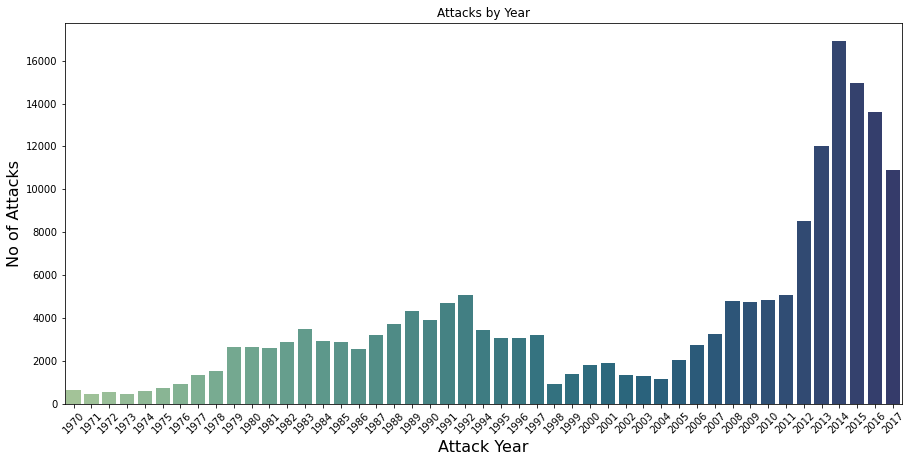

In [120]:
# No of Attacks Vs Year - Analysis graph
plt.figure(figsize=(15,7));
ax= gta['Year'].unique()
ay = gta['Year'].value_counts(dropna=False).sort_index()
sns.barplot(ax,ay,palette= 'crest')
plt.xticks(rotation=45)
plt.ylabel('No of Attacks',fontsize= 16)
plt.xlabel("Attack Year",fontsize= 16)
plt.title("Attacks by Year")
plt.show()

**Observations :**

1.  Terror attacks were rapidly increasing from the year 2004 to 2015.
2.  Last 3 years terror attacks were in decreasing trend.

### **1.2. Analysis of Terror attacks in the Year 2015**

In [178]:
# Selecting the year 2015 from Global terrorism data set for brief study
gta_2015 = gta[gta.Year==2015]

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



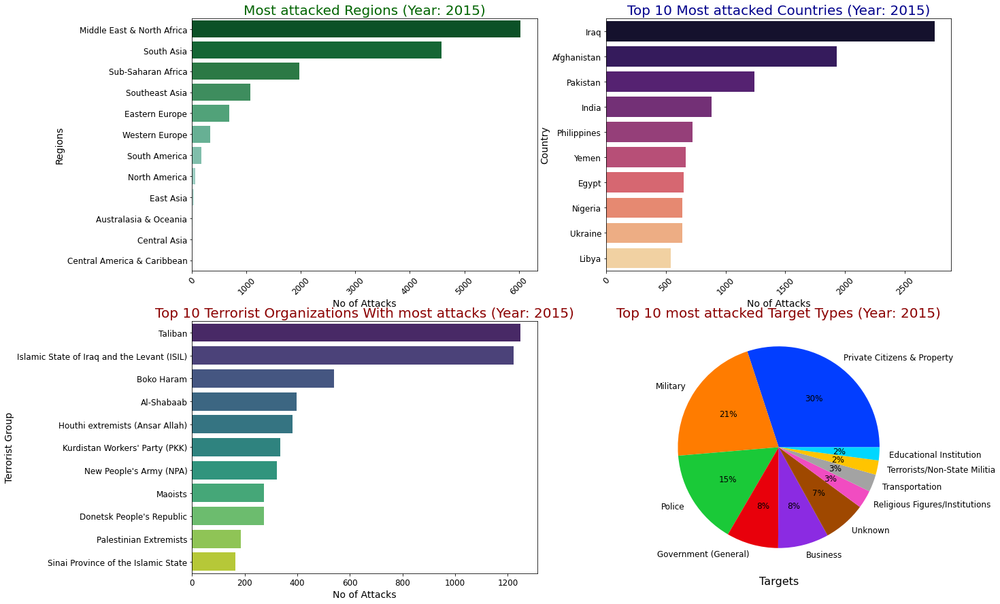

In [179]:
# Regions that were attacked most (Year: 2015)
plt.subplot(2,2,1)
sns.barplot(gta_2015['Region'].value_counts().values,gta_2015['Region'].value_counts().index,palette='BuGn_r')
plt.title("Most attacked Regions (Year: 2015)",fontsize=20,color='darkgreen')
plt.ylabel('Regions',fontsize=14)
plt.xlabel('No of Attacks',fontsize=14)
plt.xticks(rotation=45)

# Top 10 countries that were attacked (Year: 2015)
plt.subplot(2,2,2)
sns.barplot(gta_2015['Country'].value_counts().head(10).values,gta_2015['Country'].value_counts().head(10).index,palette='magma')
plt.title("Top 10 Most attacked Countries (Year: 2015)",fontsize=20,color='darkblue')
plt.ylabel('Country',fontsize=14)
plt.xlabel('No of Attacks',fontsize=14)
plt.xticks(rotation=45)

# Top 10 Terrorist Gangs involved in Terror attacks (Year: 2015)
plt.subplot(2,2,3)
sns.barplot(gta_2015['Gang_name'].value_counts()[1:12].values,gta_2015['Gang_name'].value_counts()[1:12].index, palette='viridis')
plt.title("Top 10 Terrorist Organizations With most attacks (Year: 2015)",fontsize=20,color='darkred')
plt.ylabel('Terrorist Group',fontsize= 14)
plt.xlabel("No of Attacks",fontsize= 14)

# Top 10 most attacked Target types (Year: 2015)
plt.subplot(2,2,4)
palette_color = sns.color_palette('bright')
xlabels = gta_2015['Target_type'].value_counts().head(10).index
ylabels= gta_2015['Target_type'].value_counts().head(10).values 
plt.pie(ylabels,labels=xlabels,colors=palette_color, autopct='%.0f%%')
plt.title("Top 10 most attacked Target Types (Year: 2015)",fontsize=20,color='Darkred')
plt.xlabel("Targets",fontsize=16)

plt.gcf().set_size_inches(20,15)


**Observations :**
1. In 2015, The most attacked region is 'Middle East & North Africa' then followed by South Asia
2. In 2015, The most attacked Country is 'Iraq' followed by 'Pakistan' and 'Afghanistan'
3. In 2015, 'ISIL' is the Terrorist Organization with most attacks in the world.
4. In 2015, 'Private Citizens & Property' ,'Military' and 'Police' are the 3 main targets in terror attacks

In [180]:
gta_till_2015 = gta[gta.Year <= 2015]
gta_after_2015 = gta[gta.Year > 2015]

In [181]:
gta_after_2015["Gang_name"].value_counts().sort_values(ascending = False)[1:12]

Islamic State of Iraq and the Levant (ISIL)    2769
Taliban                                        1959
Al-Shabaab                                     1134
Boko Haram                                      573
New People's Army (NPA)                         530
Kurdistan Workers' Party (PKK)                  519
Houthi extremists (Ansar Allah)                 511
Maoists                                         473
Khorasan Chapter of the Islamic State           263
Sinai Province of the Islamic State             262
Fulani extremists                               233
Name: Gang_name, dtype: int64

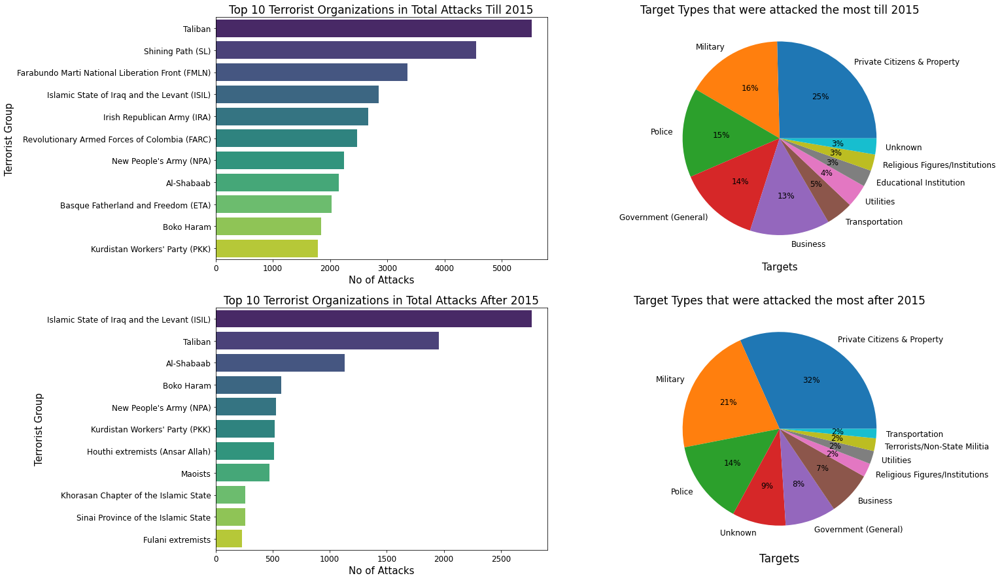

In [182]:
# Top 10 Terrorist Organizations in total attacks till 2015

plt.subplot(2,2,1)

sns.barplot(x = gta_till_2015["Gang_name"].value_counts().sort_values(ascending = False)[1:12] , y = gta_till_2015["Gang_name"].value_counts().sort_values(ascending = False)[1:12].index, palette='viridis')
plt.title("Top 10 Terrorist Organizations in Total Attacks Till 2015",fontsize = 17)
plt.ylabel('Terrorist Group',fontsize= 15)
plt.xlabel("No of Attacks",fontsize= 15)

# Target Types that were attacked the most till 2015

plt.subplot(2,2,2)
plt.pie(gta_till_2015['Target_type'].value_counts().head(10).values , labels=gta_till_2015['Target_type'].value_counts().head(10).index , autopct='%.0f%%')
plt.title("Target Types that were attacked the most till 2015",fontsize = 17)
plt.xlabel("Targets",fontsize = 15)

# Top 10 Terrorist Organizations in total attacks after 2015
plt.subplot(2,2,3)
sns.barplot(x = gta_after_2015["Gang_name"].value_counts().sort_values(ascending = False)[1:12] , y = gta_after_2015["Gang_name"].value_counts().sort_values(ascending = False)[1:12].index, palette='viridis')
plt.title("Top 10 Terrorist Organizations in Total Attacks After 2015",fontsize = 17)
plt.ylabel('Terrorist Group',fontsize= 15)
plt.xlabel("No of Attacks",fontsize= 15)

# Target Types that were attacked the most after 2015
plt.subplot(2,2,4)
plt.pie(gta_after_2015['Target_type'].value_counts().head(10).values , labels=gta_after_2015['Target_type'].value_counts().head(10).index , autopct='%.0f%%')
plt.title("Target Types that were attacked the most after 2015",fontsize = 17)
plt.xlabel("Targets",fontsize=17)

plt.gcf().set_size_inches(20,15)


###**1.3 Analysis of Most Target types World wide**

In [183]:
# Total Target Types in Terror Attacks world wide
gta['Target_type'].value_counts().sort_values(ascending= False)

Private Citizens & Property       43511
Military                          27984
Police                            24506
Government (General)              21283
Business                          20669
Transportation                     6799
Utilities                          6023
Unknown                            5898
Religious Figures/Institutions     4440
Educational Institution            4322
Government (Diplomatic)            3573
Terrorists/Non-State Militia       3039
Journalists & Media                2948
Violent Political Party            1866
Airports & Aircraft                1343
Telecommunication                  1009
NGO                                 970
Tourists                            440
Maritime                            351
Food or Water Supply                317
Abortion Related                    263
Other                               137
Name: Target_type, dtype: int64

In [184]:
# Percentage of Target type in overall targets
(gta['Target_type'].value_counts().head(10)/gta.shape[0])*100

Private Citizens & Property       23.947801
Military                          15.401974
Police                            13.487735
Government (General)              11.713844
Business                          11.375907
Transportation                     3.742068
Utilities                          3.314969
Unknown                            3.246171
Religious Figures/Institutions     2.443709
Educational Institution            2.378764
Name: Target_type, dtype: float64

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



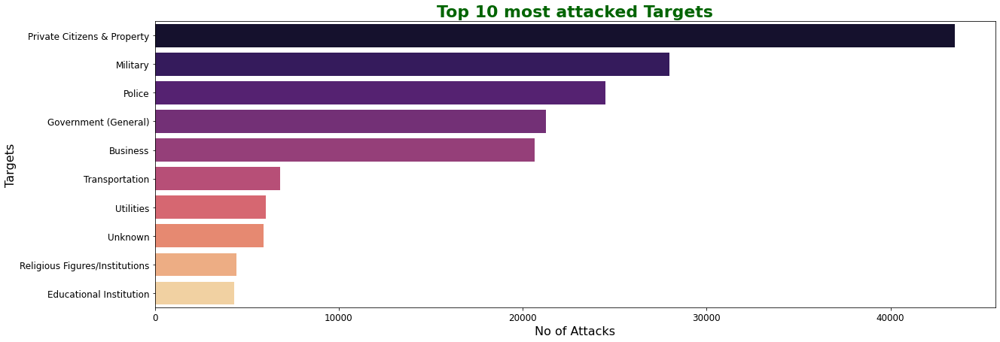

In [185]:
# Plotting Top 10 Target Type Vs No of Attacks world wide
sns.barplot(gta['Target_type'].value_counts().head(10).values,gta['Target_type'].value_counts().head(10).index,palette ='magma')
plt.title("Top 10 most attacked Targets",fontsize=22,color='Darkgreen',fontweight="bold")
plt.ylabel("Targets",fontsize=16)
plt.xlabel("No of Attacks",fontsize=16)
plt.show()

**Observations :**
1. The most attacked target is 'Private Citizens & Property' which is approximately 25%
2. Military, Police, Government and Business are of 10-20% attacked Targets

###**1.4 Analysis of Most Attack types World wide**

In [186]:
# Total Attack types in the Terror attacks world wide
gta['Attack_type'].value_counts().sort_values(ascending=False)

Bombing/Explosion                      88255
Armed Assault                          42669
Assassination                          19312
Hostage Taking (Kidnapping)            11158
Facility/Infrastructure Attack         10356
Unknown                                 7276
Unarmed Assault                         1015
Hostage Taking (Barricade Incident)      991
Hijacking                                659
Name: Attack_type, dtype: int64

In [187]:
# Percentage of Attack type in overall Attacks
round((gta['Attack_type'].value_counts()/gta.shape[0])*100,2)

Bombing/Explosion                      48.57
Armed Assault                          23.48
Assassination                          10.63
Hostage Taking (Kidnapping)             6.14
Facility/Infrastructure Attack          5.70
Unknown                                 4.00
Unarmed Assault                         0.56
Hostage Taking (Barricade Incident)     0.55
Hijacking                               0.36
Name: Attack_type, dtype: float64

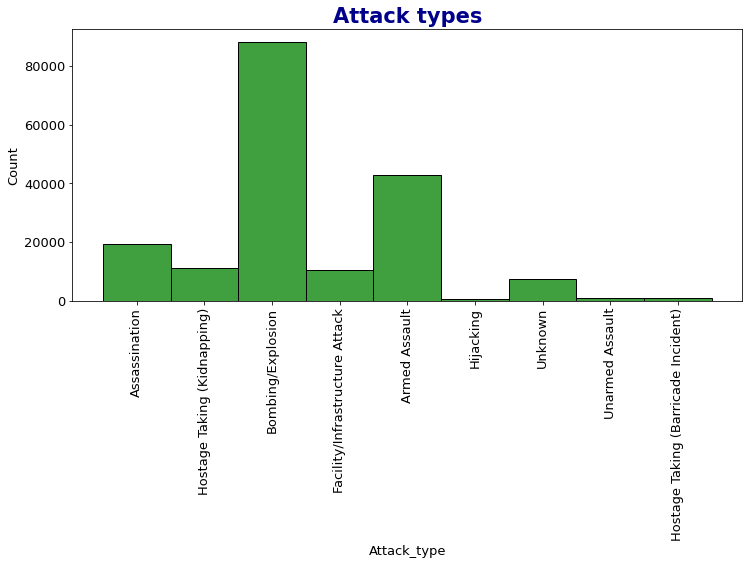

In [188]:
# Plotting Top 10 Attack Type Vs No of Attacks world wide
plt.figure(figsize=(12,5));
plt.rcParams.update({'font.size':13});
plt.xticks(rotation = 90)
plt.title('Attack types',fontsize=21,color='Darkblue',fontweight="bold")
sns.histplot(gta['Attack_type'],palette='rocket',color='green')

**Observations:**
1. 50% of the Attacks happened with Bombing/Explosions
2. 10-20% of the Attcks happened with Armed assault and Assassination. Rest are in between 0-6%


###**1.5 Analysis of Most used Weapon types in Terror attacks**

In [132]:
# Total Weapon types used in the Terror attacks world wide
gta['Weapon_Type'].value_counts().sort_values(ascending=False)

Explosives                                                                     92426
Firearms                                                                       58524
Unknown                                                                        15157
Incendiary                                                                     11135
Melee                                                                           3655
Chemical                                                                         321
Sabotage Equipment                                                               141
Vehicle (not to include vehicle-borne explosives, i.e., car or truck bombs)      136
Other                                                                            114
Biological                                                                        35
Fake Weapons                                                                      33
Radiological                                                     

In [133]:
# Percentage of Weapon type used in overall Attacks
round((gta['Weapon_Type'].value_counts()/gta.shape[0])*100,2)[:7]

Explosives            50.87
Firearms              32.21
Unknown                8.34
Incendiary             6.13
Melee                  2.01
Chemical               0.18
Sabotage Equipment     0.08
Name: Weapon_Type, dtype: float64

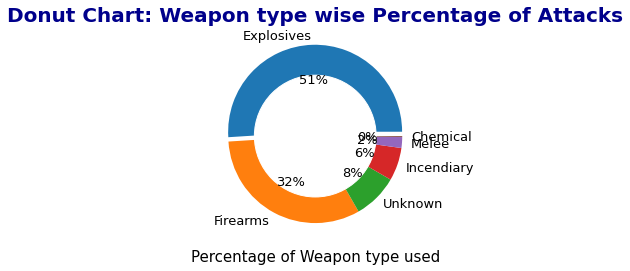

In [134]:
# Donut chart indicating the percentage of Weapon types used for attacks
explode = (0.05,0,0,0,0,0)
plt.pie(round((gta['Weapon_Type'].value_counts()/gta.shape[0])*100,2)[:6],explode=explode,labels=round((gta['Weapon_Type'].value_counts()/gta.shape[0])*100,2)[:6].index,
        autopct='%.0f%%')
my_circle = plt.Circle((0,0),0.7,color='white')
plt.title("Donut Chart: Weapon type wise Percentage of Attacks",color="Darkblue",fontsize=20,fontweight="bold")
plt.xlabel("Percentage of Weapon type used",fontsize=15)
p=plt.gcf().gca().add_artist(my_circle)
plt.rcParams['figure.figsize'] = (20,7)
plt.show()


**Observations:**
1. Explosives were used for more than 50% of the Attacks.
2. 6-30% of the Attacks happened with Firearms and Incendiary. Rest are in between 0-2%

###**1.6 Analysis of Terrorist attacks with respect to Kids as hostages**

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



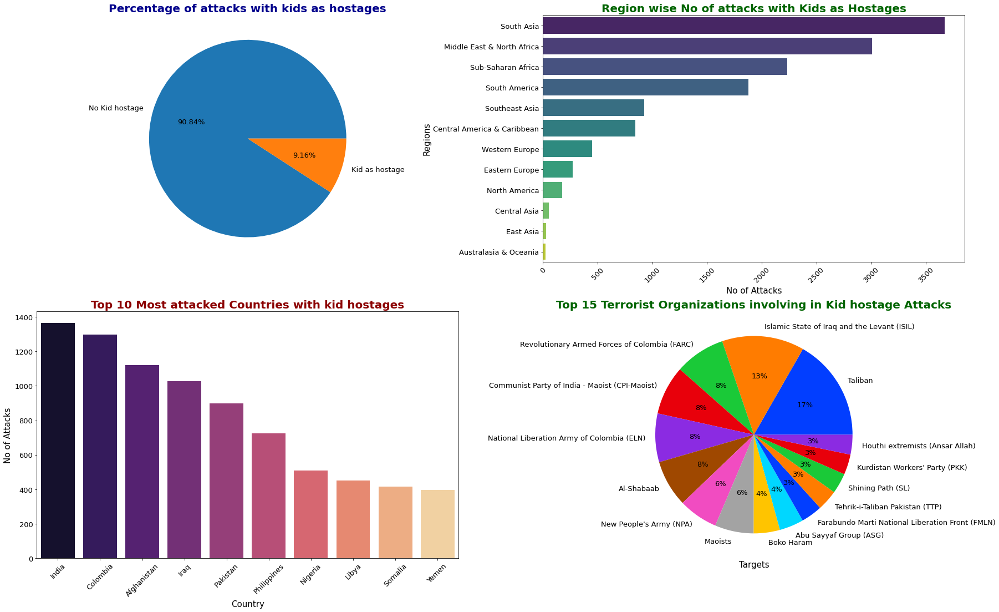

In [135]:
# Pie chart for finding the percentage of kid hostages in terrror attacks
plt.subplot(2,2,1)
gta.loc[gta['ishostkid']<0,'ishostkid']=0
gta['ishostkid']=gta['ishostkid'].fillna(0)
plt.pie(gta[gta['Year']>=2015].groupby(['ishostkid'])['ishostkid'].count(),labels=['No Kid hostage','Kid as hostage'],autopct="%1.2f%%")
plt.title("Percentage of attacks with kids as hostages",fontsize=20,fontweight="bold",color='Darkblue')
plt.gcf().set_size_inches(15,7)

gta_kid= gta[gta.ishostkid==1]

# Regions with Kid hostages
plt.subplot(2,2,2)
sns.barplot(gta_kid['Region'].value_counts().values,gta_kid['Region'].value_counts().index,palette='viridis')
plt.title("Region wise No of attacks with Kids as Hostages",fontsize=20,fontweight="bold",color='darkgreen')
plt.ylabel('Regions',fontsize=15)
plt.xlabel('No of Attacks',fontsize=15)
plt.xticks(rotation=45)

# Top 10 countries with Kid hostages
plt.subplot(2,2,3)
sns.barplot(gta_kid['Country'].value_counts().head(10).index,gta_kid['Country'].value_counts().head(10).values,palette='magma')
plt.title("Top 10 Most attacked Countries with kid hostages",fontsize=20,fontweight="bold",color='darkred')
plt.xlabel('Country',fontsize=15)
plt.ylabel('No of Attacks',fontsize=15)
plt.xticks(rotation=45)

# Top 10 Terrorist Gangs involved in Kid hostage attacks
plt.subplot(2,2,4)
# sns.barplot(gta_kid['Gang_name'].value_counts()[1:11].values,gta_kid['Gang_name'].value_counts()[1:11].index, palette='viridis')
# plt.title("Top 10 Terrorist Organizations involved in Kid hostage attacks",fontsize=20,color='darkgreen')
# plt.ylabel('Terrorist Group',fontsize= 15)
# plt.xlabel("No of Attacks",fontsize= 15)

# Top 10 most attacked Target types as kid hostages
# plt.subplot(2,2,4)
palette_color = sns.color_palette('bright')
xlabels = gta_kid['Gang_name'].value_counts()[1:].head(15).index
ylabels= gta_kid['Gang_name'].value_counts()[1:].head(15).values 
plt.pie(ylabels,labels=xlabels,colors=palette_color, autopct='%.0f%%')
plt.title("Top 15 Terrorist Organizations involving in Kid hostage Attacks",fontsize=20,fontweight="bold",color='Darkgreen')
plt.xlabel("Targets",fontsize=15)

plt.gcf().set_size_inches(30,18)


**Observations:**
1. About 9% of terrorist attacks were happened with kids as hostages.

###**1.7 Success/ Failure analysis of Terrorist attacks**

Text(0.5, 1.0, 'Success Percentage From all incidents from 1970 to 2017')

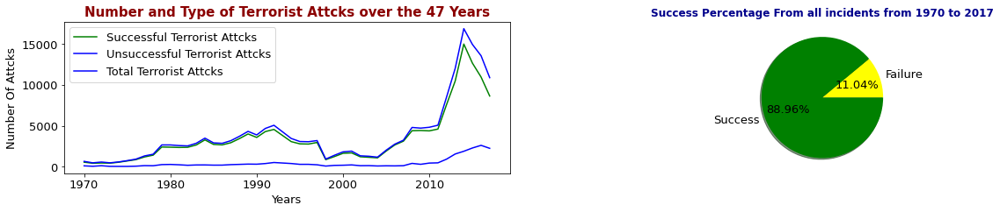

In [136]:
plt.subplot(2,2,1)

plt.plot(gta[gta["Success"].isin([1])].groupby(["Year"])["Success"].count() , label = "Successful Terrorist Attcks" , color = "Green")
plt.plot(gta[gta["Success"].isin([0])].groupby(["Year"])["Success"].count() , label = "Unsuccessful Terrorist Attcks" , color = "blue")
plt.plot(gta["Year"].value_counts(dropna=False).sort_index() , label = "Total Terrorist Attcks" , color = "blue")

plt.xlabel("Years")
plt.ylabel("Number Of Attcks")
plt.title("Number and Type of Terrorist Attcks over the 47 Years" , fontsize = 15, fontweight ="bold",color='Darkred')
plt.legend()


plt.subplot(2,2,2)

plt.pie(gta.groupby(["Success"])["Success"].count() , labels = ["Failure" , "Success"] , autopct='%1.2f%%', colors=['yellow','green'],shadow=True)
plt.title("Success Percentage From all incidents from 1970 to 2017" , fontsize = 12, fontweight ="bold",color='Darkblue')

# plt.subplot(2,2,3)


# plt.pie(gta[gta["Year"] < 2015].groupby(["Success"])["Success"].count() , labels = ["Failure" , "Success"] , autopct='%1.2f%%',colors=['#ff9999','#66b3ff'],shadow=True)#['grey','red'])
# plt.title("Success Percentage From all incidents from 1970 to 2015" , fontsize = 12, fontweight ='bold',color='Darkred')

# plt.subplot(2,2,4)

# plt.pie(gta[gta["Year"] >= 2015].groupby(["Success"])["Success"].count() , labels = ["Failure" , "Success"] , autopct='%1.2f%%',colors=['#ff9999','#66b3ff'],shadow=True)


# plt.title("Success Percentage From all incidents from 2013 to 2017" , fontsize = 12, fontweight ="bold",color='Darkgreen')

# plt.gcf().set_size_inches(20,12)

## **2. Region wise Terror attacks Analysis**

### **2.1. Analysis of Year Vs No of Attacks Regional wise**

In [137]:
reg = pd.crosstab(gta.Year, gta.Region)
reg

Region,Australasia & Oceania,Central America & Caribbean,Central Asia,East Asia,Eastern Europe,Middle East & North Africa,North America,South America,South Asia,Southeast Asia,Sub-Saharan Africa,Western Europe
Year,,,,,,,,,,,,
1970,1,7,0,2,12,28,472,65,1,10,3,50
1971,1,5,0,1,5,55,247,24,0,6,2,125
1972,8,3,0,0,1,53,73,33,1,16,4,376
1973,1,6,0,2,1,19,64,83,1,2,4,290
1974,1,11,0,4,2,42,111,81,2,3,7,317
1975,0,9,0,12,0,44,159,55,4,7,12,438
1976,0,45,0,2,0,55,125,91,4,12,11,578
1977,0,24,0,4,2,211,149,119,2,8,29,771
1978,2,199,0,35,2,128,117,222,2,44,46,729


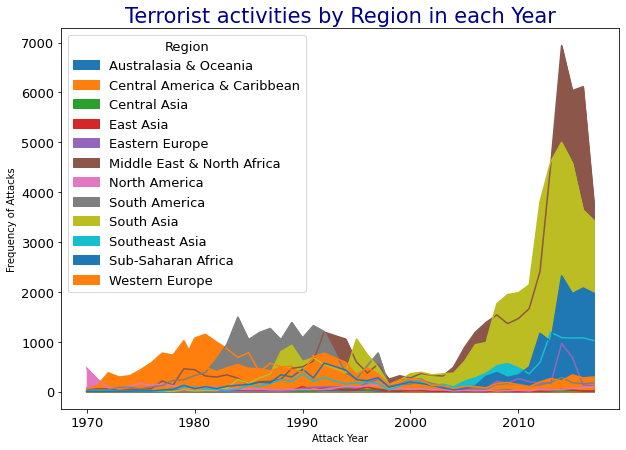

In [138]:
# Area plot representing the Year Vs no of Attacks Regional wise
reg.plot(kind='area',stacked=False,alpha=1,figsize=(10,7))
plt.ylabel('Frequency of Attacks',fontsize= 10)
plt.xlabel("Attack Year",fontsize= 10)
plt.title("Terrorist activities by Region in each Year",fontsize=21,color='Darkblue')
plt.show()

**Observations :**
1. Middle East & North Africa is the region with most number of Terror attacks in the world.
2. South Asia is the second most attacked region

### **2.2. Analysis of Year Vs Frequency of Attacks Regional wise**

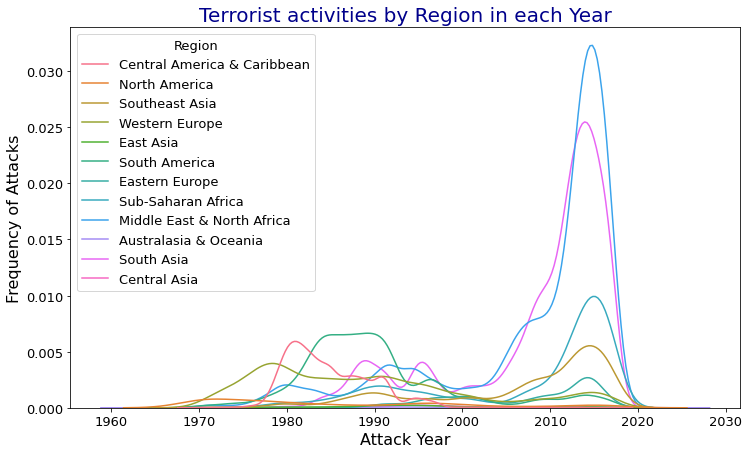

In [139]:
# Line plot representing the Year Vs Frequency of Attacks Regional wise
plt.figure(figsize=(12,7))
sns.kdeplot(gta['Year'],hue= gta['Region'])
plt.ylabel('Frequency of Attacks',fontsize= 16)
plt.xlabel("Attack Year",fontsize= 16)
plt.title("Terrorist activities by Region in each Year",fontsize=20,color='Darkblue')
plt.show()

**Observations :**
1. 'Middle East & North Africa' is the region with most frequent terror attacks in the world followed by 'South Asia'.

### **2.3. Analysis of Terrorist attacked locations on World Map**

In [140]:
#fig= px.scatter_geo(gta,lat='latitude',lon='longitude',hover_name="Country")
fig = px.scatter_geo(gta,lat='latitude',lon='longitude',hover_name="Country",color="Region")
fig.update_geos(projection_type="orthographic")
fig.update_layout(title='World wide Terrorist Attacked Regions (1970-2017)',title_x=0.5)
fig.update_layout(height=350, margin={"r":0,"t":35,"l":0,"b":0})
fig.show()

### **2.4. Analysis of Terror attacks in 'Middle East & North Africa' region**

In [141]:
gta_ME = gta[gta.Region=='Middle East & North Africa']

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



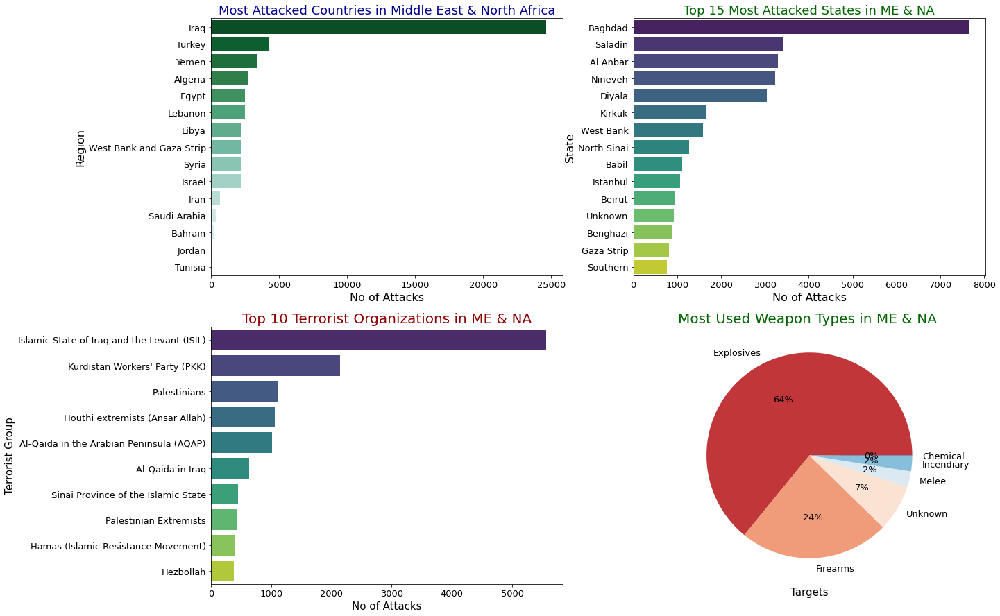

In [142]:
# Top 15 Countries in Middle East & North Africa which were attacked most by Terrorists
plt.subplot(2,2,1)
sns.barplot(gta_ME['Country'].value_counts().head(15).values,gta_ME['Country'].value_counts().head(15).index, palette='BuGn_r')
plt.title("Most Attacked Countries in Middle East & North Africa",fontsize= 18,color='Darkblue')
plt.ylabel('Region',fontsize=16)
plt.xlabel('No of Attacks',fontsize = 16)

# Top 15 States which were attacked in Middle East & North Africa region by Terrorists
plt.subplot(2,2,2)
sns.barplot(gta_ME['State'].value_counts().head(15).values,gta_ME['State'].value_counts().head(15).index, palette='viridis')
plt.title("Top 15 Most Attacked States in ME & NA",fontsize= 18,color='Darkgreen')
plt.ylabel('State',fontsize=16)
plt.xlabel('No of Attacks',fontsize = 16)
plt.gcf().set_size_inches(20,6)

# Top 10 Terrorist Gangs involved Terror attacks in Middle East & North Africa (ME & NA)
plt.subplot(2,2,3)
sns.barplot(gta_ME['Gang_name'].value_counts()[1:11].values,gta_ME['Gang_name'].value_counts()[1:11].index, palette='viridis')
plt.title("Top 10 Terrorist Organizations in ME & NA",fontsize=20,color='darkred')
plt.ylabel('Terrorist Group',fontsize= 15)
plt.xlabel("No of Attacks",fontsize= 15)

# Most used Weapon types for attacks in Middle East & North Africa (ME & NA)
plt.subplot(2,2,4)
palette_color = sns.color_palette('RdBu')
xlabels = gta_ME['Weapon_Type'].value_counts().head(6).index
ylabels= gta_ME['Weapon_Type'].value_counts().head(6).values 
plt.pie(ylabels,labels=xlabels, autopct='%.0f%%',colors=palette_color)
plt.title("Most Used Weapon Types in ME & NA ",fontsize=20,color='Darkgreen')
plt.xlabel("Targets",fontsize=15)

plt.gcf().set_size_inches(20,15)

**Observations :**
1. In 'Middle East & North Africa' region, Iraq is the country with most no. of Terror attacks followed by Turkey & Yemen.
2. 'Baghdad','Saladin' and 'Al Anbar' are the top three states with most no. of terror attacks in this region.
3. "Islamic State of Iraq and the Levant (ISIL)" is the Terrorist Group with highest no. of attacks in this region.
4. Around 65% of the attacks were carried out using 'Explosives' and 25% using firearms.

## **3. Country wise Terror attacks Analysis**

### **3.1. Country Vs No of Terror attacks analysis**

In [143]:
# Top 10 countreies with Most terror Attacks in the World 
gta['Country'].value_counts().head(10)

Iraq              24636
Pakistan          14368
Afghanistan       12731
India             11960
Colombia           8306
Philippines        6908
Peru               6096
El Salvador        5320
United Kingdom     5235
Turkey             4292
Name: Country, dtype: int64

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



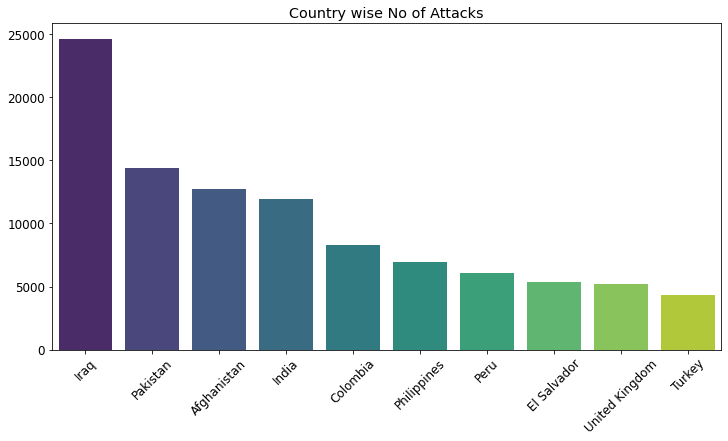

In [144]:
# Figure representing Country Vs No of Attacks 
plt.figure(figsize=(12,6));
plt.rcParams.update({'font.size':12})
plt.xticks(rotation=45)
plt.title("Country wise No of Attacks")
sns.barplot(gta['Country'].value_counts()[:10].index,gta['Country'].value_counts()[:10].values,palette='viridis')

**Observations :**
1. Iraq is the country with most terror attacks followed by Pakistan,Afghanistan and India. 

### **3.2. Analysis of Terrorist attacks in India**

### **3.2.1 Analysis of Year wise Terror attacks in India**

In [145]:
gta_india = gta[gta.Country=='India']

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



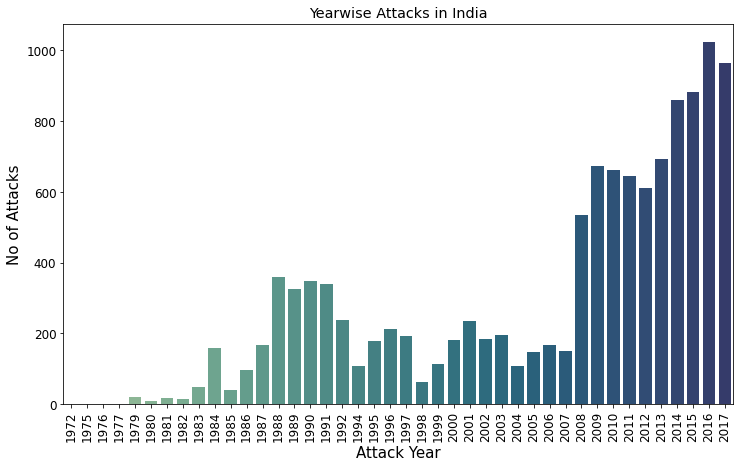

In [146]:
ax= gta_india['Year'].unique()
ay = gta_india['Year'].value_counts(dropna=False).sort_index()
plt.figure(figsize=(12,7))
sns.barplot(ax,ay,palette= 'crest')
plt.xticks(rotation=90)
plt.ylabel('No of Attacks',fontsize= 15)
plt.xlabel("Attack Year",fontsize= 15)
plt.title("Yearwise Attacks in India")
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



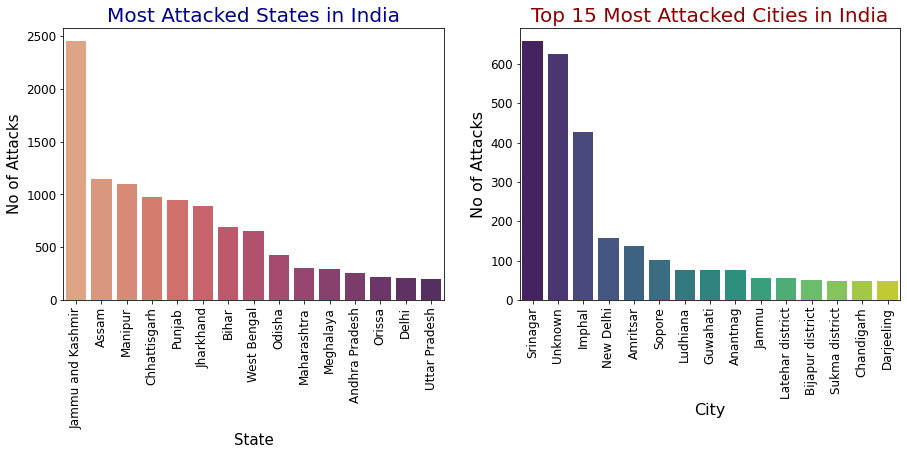

In [147]:
# Top 10 states in India which were attacked by Terrorists:
plt.subplot(1,2,1)
sns.barplot(gta_india['State'].value_counts().head(15).index,gta_india['State'].value_counts().head(15).values, palette='flare')
plt.title("Most Attacked States in India",fontsize= 20,color='Darkblue')
plt.xlabel('State',fontsize=15)
plt.ylabel('No of Attacks',fontsize = 15)
plt.xticks(rotation=90)

# Top 15 Cities in India which were attacked by Terrorists:
plt.subplot(1,2,2)
sns.barplot(gta_india['City'].value_counts().head(15).index,gta_india['City'].value_counts().head(15).values, palette='viridis')
plt.title("Top 15 Most Attacked Cities in India",fontsize= 20,color='Darkred')
plt.xlabel('City',fontsize=16)
plt.ylabel('No of Attacks',fontsize = 16)
plt.xticks(rotation=90)
plt.gcf().set_size_inches(15,5)

**Observations :**
1. In 2016, India has suffered the most number of Terrorist attacks.
2. 'Jammu and Kashmir' is the State with most Terror attacks in India succeeded by 'Assam'
2. 'Srinagar' is the city with most attacks in India

### 3.2.2 Analysis of Terrorist Attacked locations in India - State wise

In [148]:
# Plotting Latitude & Longitude of location in India
fig = px.scatter_geo(gta_india,lat='latitude',lon='longitude',hover_name="City",color='State',projection='natural earth')
fig.update_layout(title='Terrorist Attacked Regions in India (1970-2017)',title_x=0.5)
fig.update_geos(fitbounds="locations",visible=False)
fig.update_layout(height=400, margin={"r":0,"t":35,"l":0,"b":0})
fig.show()

### **3.2.3 Analysis of Terrorist attacks in India in the Year 2016**


In [149]:
# Condition to get the Attacks in india in the Year 2016
gta_ind_2016 = gta[(gta.Country=='India') & (gta.Year==2016)]

In [150]:
# Most attacked Terrorist Groups in India after dropping 'Unkowns'
gta_ind_2016['Gang_name'].value_counts()[1:11]

Maoists                                                         266
Communist Party of India - Maoist (CPI-Maoist)                   95
United Liberation Front of Assam (ULFA)                          24
Lashkar-e-Taiba (LeT)                                            16
National Socialist Council of Nagaland-Isak-Muivah (NSCN-IM)     16
Hizbul Mujahideen (HM)                                           16
Garo National Liberation Army                                    15
People's Liberation Front of India                               12
Separatists                                                      10
National Socialist Council of Nagaland-Khaplang (NSCN-K)          7
Name: Gang_name, dtype: int64

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



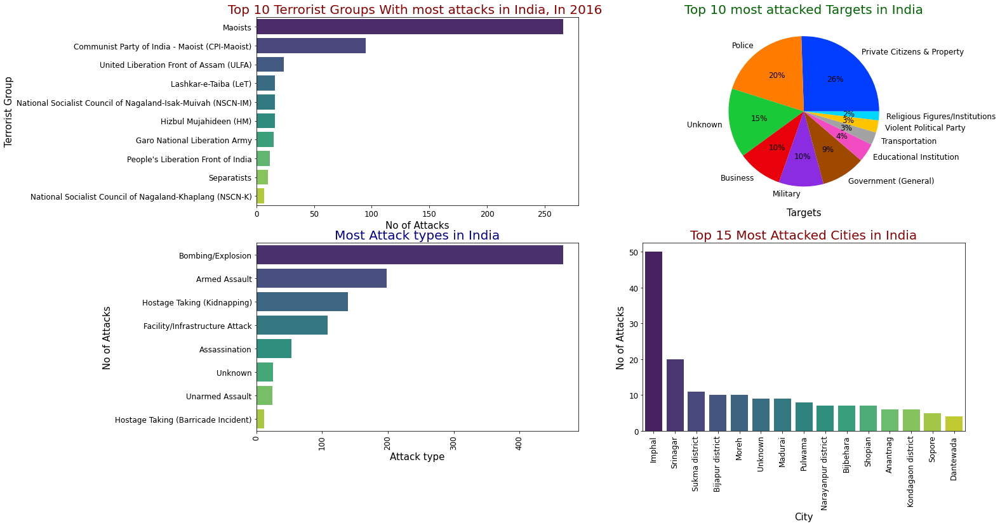

In [151]:
plt.subplot(2,2,1)
sns.barplot(gta_ind_2016['Gang_name'].value_counts()[1:11].values,gta_ind_2016['Gang_name'].value_counts()[1:11].index, palette='viridis')
plt.title("Top 10 Terrorist Groups With most attacks in India, In 2016 ",fontsize=20,color='Darkred')
plt.ylabel('Terrorist Group',fontsize= 15)
plt.xlabel("No of Attacks",fontsize= 15)

plt.subplot(2,2,2)
palette_color = sns.color_palette('bright')
xlabels = gta_ind_2016['Target_type'].value_counts().head(10).index
ylabels= gta_ind_2016['Target_type'].value_counts().head(10).values 
plt.pie(ylabels,labels=xlabels,colors=palette_color, autopct='%.0f%%')
plt.title("Top 10 most attacked Targets in India",fontsize=20,color='Darkgreen')
plt.xlabel("Targets",fontsize=15)


plt.subplot(2,2,3)
sns.barplot(gta_ind_2016['Attack_type'].value_counts().values,gta_ind_2016['Attack_type'].value_counts().index,palette ='viridis')
plt.title("Most Attack types in India",fontsize=20,color='Darkblue')
plt.xlabel("Attack type",fontsize=15)
plt.ylabel("No of Attacks",fontsize=15)
plt.xticks(rotation=90)

plt.subplot(2,2,4)
sns.barplot(gta_ind_2016['City'].value_counts().head(15).index,gta_ind_2016['City'].value_counts().head(15).values, palette='viridis')
plt.title("Top 15 Most Attacked Cities in India",fontsize= 20,color='Darkred')
plt.xlabel('City',fontsize=15)
plt.ylabel('No of Attacks',fontsize = 15)
plt.xticks(rotation=90)

plt.gcf().set_size_inches(20,12)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning:

In a future version of pandas all arguments of Series.dropna will be keyword-only



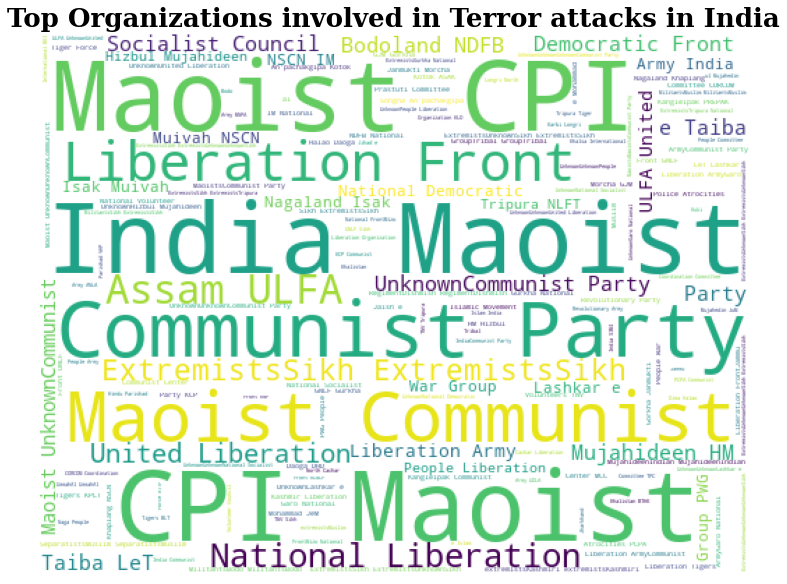

In [152]:
cities = gta_india.Gang_name.dropna(False)
plt.subplots(figsize=(20,10))
wordcloud= WordCloud(background_color='White',
                     width=512,
                     height=390).generate(''.join(cities))
plt.axis('off')
plt.imshow(wordcloud)
plt.title('Top Organizations involved in Terror attacks in India',fontdict={'family':'serif','color':'black','weight':'bold','size':26})
plt.show()

**Observations :**
1. Moaists is the terrorist group responsible for most attacks in India in 2016.
2. 'Private Citizens & Property' are the main target type in the attacks
3. 'Bombs & Explosives' were mostly used for attacks
4. Imphal is the city which was mostly attacked by Terrorists.

### **3.2.4 Analysis of Month wise No of Deaths and the Responsible Terrorist Group in the year 2016**

In [153]:
fig3 = px.bar(gta_ind_2016,x='Month',y='victims',color='Gang_name',
              labels= {'victims': 'No of victims'},
              title= 'No of Victims Month wise and the Responsible Terrorist Group in 2016',
              hover_data= ['victims','Region'])
fig3.show()

**Observations :**
1. 'Moists' attacks were almost there in everymonth of the year 2016.
2. Aug-2016 was month with most victims (killed+wounded) of around 160 people.

## **4. Terrorist group wise Terror attacks Analysis**

In [154]:
# Terrorist groups with Most terror attacks world wide
gta['Gang_name'].value_counts()

Unknown                                             82782
Taliban                                              7478
Islamic State of Iraq and the Levant (ISIL)          5613
Shining Path (SL)                                    4555
Farabundo Marti National Liberation Front (FMLN)     3351
                                                    ...  
Ansar Sarallah                                          1
Sword of Islam                                          1
Support of Ocalan-The Hawks of Thrace                   1
Arab Revolutionary Front                                1
MANO-D                                                  1
Name: Gang_name, Length: 3537, dtype: int64

In [155]:
# Excluding 'Unkown' taking the percentage of terror attacks
top_terror_groups = round((gta['Gang_name'].value_counts()/gta.shape[0])*100,2)[1:].head(10)
top_terror_groups

Taliban                                             4.12
Islamic State of Iraq and the Levant (ISIL)         3.09
Shining Path (SL)                                   2.51
Farabundo Marti National Liberation Front (FMLN)    1.84
Al-Shabaab                                          1.81
New People's Army (NPA)                             1.53
Irish Republican Army (IRA)                         1.47
Revolutionary Armed Forces of Colombia (FARC)       1.37
Boko Haram                                          1.33
Kurdistan Workers' Party (PKK)                      1.27
Name: Gang_name, dtype: float64

### **4.1. Analysis of Terrorist Group Vs No of Attacks world wide**

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



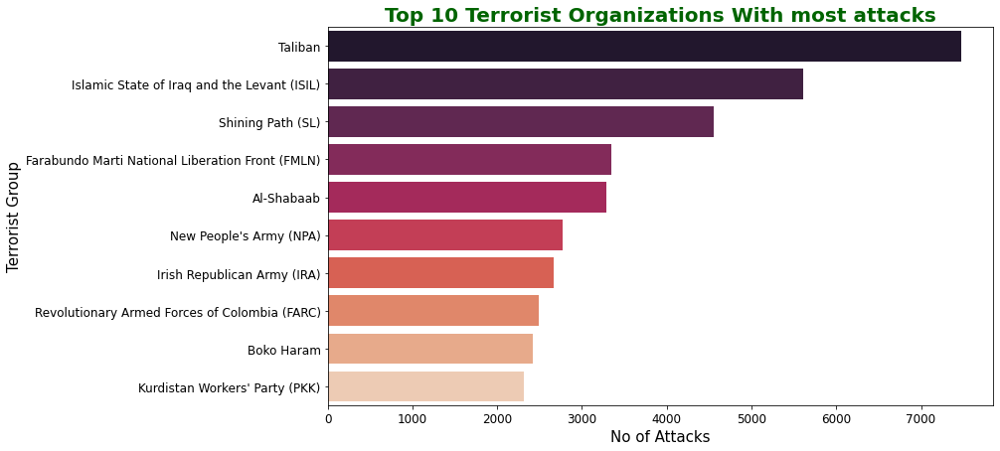

In [156]:
# Terrorist Group Vs No of attacks they have done
plt.figure(figsize=(12,7))
sns.barplot(gta['Gang_name'].value_counts()[1:11].values,gta['Gang_name'].value_counts()[1:11].index, palette='rocket')
plt.title("Top 10 Terrorist Organizations With most attacks",fontsize=20,fontweight='bold',color='Darkgreen')
plt.ylabel('Terrorist Group',fontsize= 15)
plt.xlabel("No of Attacks",fontsize= 15)
plt.show()

**Observations :**
1. 'Taliban' is the terrorist organization with most attacks in the world

### **4.2. Analysis of Top 3 Terrorist Organizations in the World**

In [157]:
gta_top3 = gta[(gta.Gang_name=='Taliban') | (gta.Gang_name=='Islamic State of Iraq and the Levant (ISIL)') | (gta.Gang_name=='Shining Path (SL)')]

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



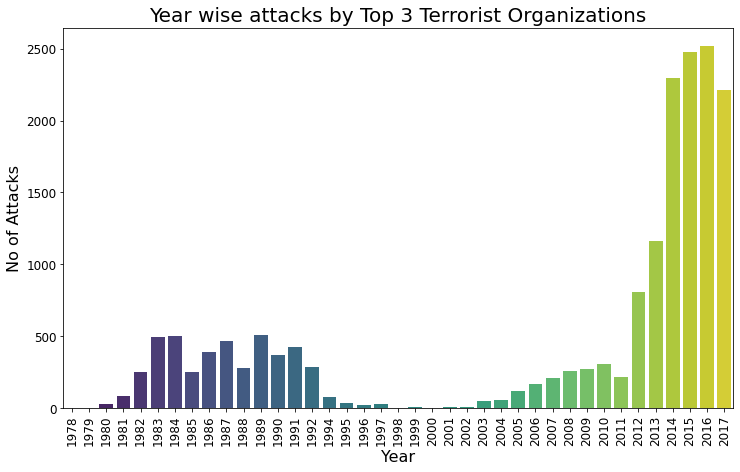

In [158]:
# Year wise attacks by Top 3 Terrorist Organizations
plt.figure(figsize=(12,7))
sns.barplot(gta_top3['Year'].value_counts().index,gta_top3['Year'].value_counts().values, palette='viridis')
plt.title("Year wise attacks by Top 3 Terrorist Organizations",fontsize=20)
plt.ylabel('No of Attacks',fontsize= 16)
plt.xlabel("Year",fontsize= 16)
plt.xticks(rotation=90)
plt.show()  

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



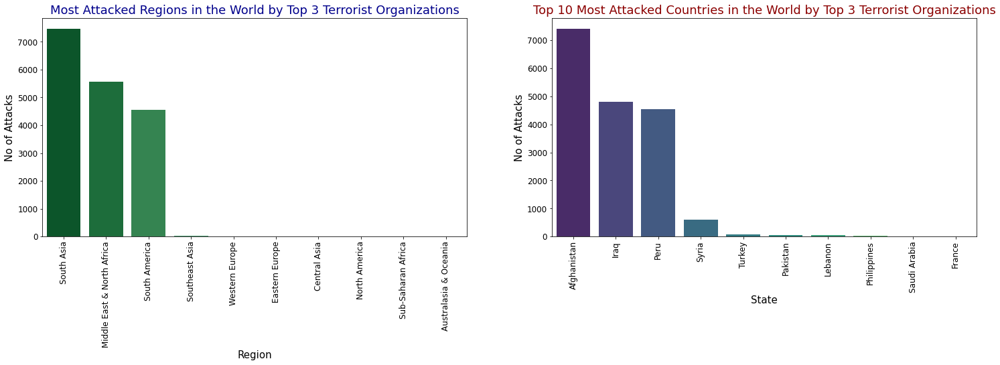

In [159]:
# Region wise attacks by Top 3 Terrorist organizations in the World
plt.subplot(1,2,1)
sns.barplot(gta_top3['Region'].value_counts().index,gta_top3['Region'].value_counts().values, palette='BuGn_r')
plt.title("Most Attacked Regions in the World by Top 3 Terrorist Organizations",fontsize= 18,color='Darkblue')
plt.xlabel('Region',fontsize=15)
plt.xticks(rotation=90)
plt.ylabel('No of Attacks',fontsize = 15)

# Top 10 Countries which were attacked by Top 3 Terrorist Organizations in the World
plt.subplot(1,2,2)
sns.barplot(gta_top3['Country'].value_counts().head(10).index,gta_top3['Country'].value_counts().head(10).values, palette='viridis')
plt.title("Top 10 Most Attacked Countries in the World by Top 3 Terrorist Organizations",fontsize= 18,color='Darkred')
plt.xlabel('State',fontsize=15)
plt.xticks(rotation=90)
plt.ylabel('No of Attacks',fontsize = 15)
plt.gcf().set_size_inches(25,6)

**Observations :**
1. These top 3 organizations attacks were increased from the year 2013 to 2015 which can be corelated to the withdrawal of US soldiers from Afghanistan. 
2. 'South Asia','Middle East & North Africa' & 'South America' are the top 3 regions affected by these 3 terrorist Organizations.
3. Afghanistan, Iraq and Peru are the top 3 countries with highest number of attacks. 



# **II. Bivariate Analysis**

##**5. Analysis on Region wise No of persons Killed Vs Wounded**

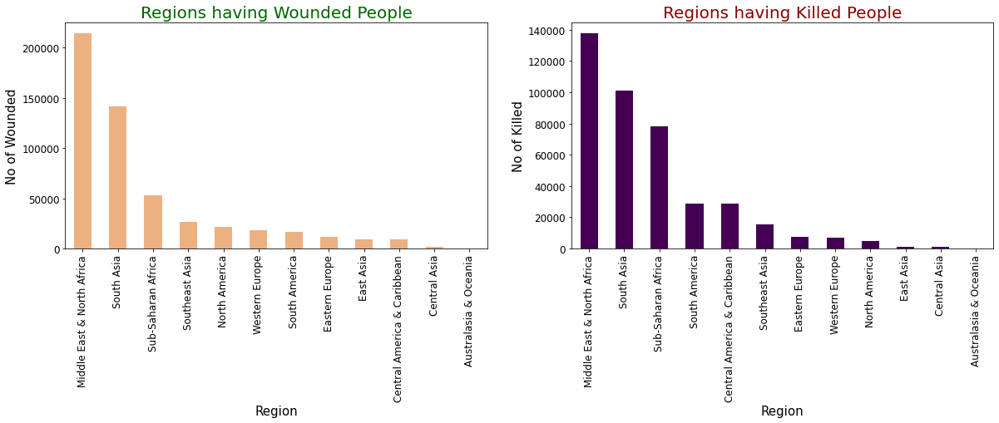

In [160]:
plt.subplot(1,2,1)

gta.groupby(['Region'])['Wounds'].sum().sort_values(ascending=False).plot(kind='bar',colormap='flare')
plt.title("Regions having Wounded People",fontsize= 20,color='darkgreen')
plt.xlabel('Region',fontsize=15)
plt.ylabel('No of Wounded',fontsize =15)
plt.xticks(rotation=90)

plt.subplot(1,2,2)
gta.groupby(['Region'])['Kills'].sum().sort_values(ascending=False).plot(kind='bar',colormap='viridis')
plt.title("Regions having Killed People",fontsize= 20,color='darkred')
plt.xlabel('Region',fontsize=15)
plt.ylabel('No of Killed',fontsize =15)
plt.xticks(rotation=90)
plt.gcf().set_size_inches(20,5)

**Observations :**
1. Middle East & North Africa has the most killed people(>1.4 Lacs) and wounded people (>2 Lacs)
2. Region wise rate of Kills & wounded people are similar to each other.

## **6. Analysis on Year wise No of attacks Vs Victims**

In [161]:
no_of_attacks_per_year = gta.groupby('Year').size().rename("No of Attacks")

In [162]:
gta[['Year','Kills','Wounds']]

,Year,Kills,Wounds
0,1970,1.0,0.0
1,1970,0.0,0.0
2,1970,1.0,0.0
3,1970,0.0,0.0
4,1970,0.0,0.0
...,...,...,...
181686,2017,1.0,2.0
181687,2017,2.0,7.0
181688,2017,0.0,0.0
181689,2017,0.0,0.0


In [163]:
year_by_kills_wounds = gta.groupby('Year').agg({'Kills':'sum','Wounds':'sum'})

In [164]:
terror_trend = pd.concat([year_by_kills_wounds,no_of_attacks_per_year],axis=1)

In [165]:
#Lets create Victims column, which is the sum of no of persons killed and wounded due to terror attack
terror_trend['victims']=terror_trend['Kills']+terror_trend['Wounds']

In [166]:
terror_trend.head()

,Kills,Wounds,No of Attacks,victims
Year,,,,
1970,174.0,212.0,651,386.0
1971,173.0,82.0,471,255.0
1972,566.0,409.0,568,975.0
1973,370.0,495.0,473,865.0
1974,539.0,865.0,581,1404.0


In [167]:
fig = px.line(terror_trend,x=terror_trend.index, y ='victims',title="Terrorist attacks trend",template='plotly_dark')
fig.data[0].name= "No of Victims"
fig.update_traces(showlegend=True)
fig.add_scatter(x=terror_trend.index, y=terror_trend['No of Attacks'], mode= 'lines',name = 'No of Attacks')
fig.update_layout(xaxis_title='Year',yaxis_title='Terrorism Trends')
fig.show()

**Observations :**

1. Year wise no of attacks and victims rate are proportional to each other.

In [168]:
fig5 = px.treemap(gta,values='victims',
                  path=['Region','Target_type'],
                  color_discrete_sequence=px.colors.qualitative.Dark24,
                  title='Treemap Chart: Grouping the Target type groups in different regions')
fig5.show()

**Observations :**
1. Private Citizens & Properties, Military and Police are the most target types in almost all the regions

In [169]:
fig5 = px.treemap(gta,values='victims',
                  path=['Weapon_Type','Country'],
                  color_discrete_sequence=px.colors.qualitative.Dark24,
                  title='Treemap Chart: Grouping the Weapon type wise attacks with respect to country')
fig5.show()

## **7. Analysis on Co-relation between No of Attacks, People killed and Wounded**

In [170]:
samp = terror_trend.corr()

In [171]:
samp

,Kills,Wounds,No of Attacks,victims
Kills,1.000000,0.907918,0.966005,0.972601
Wounds,0.907918,1.000000,0.893600,0.980486
No of Attacks,0.966005,0.893600,1.000000,0.948715
victims,0.972601,0.980486,0.948715,1.000000


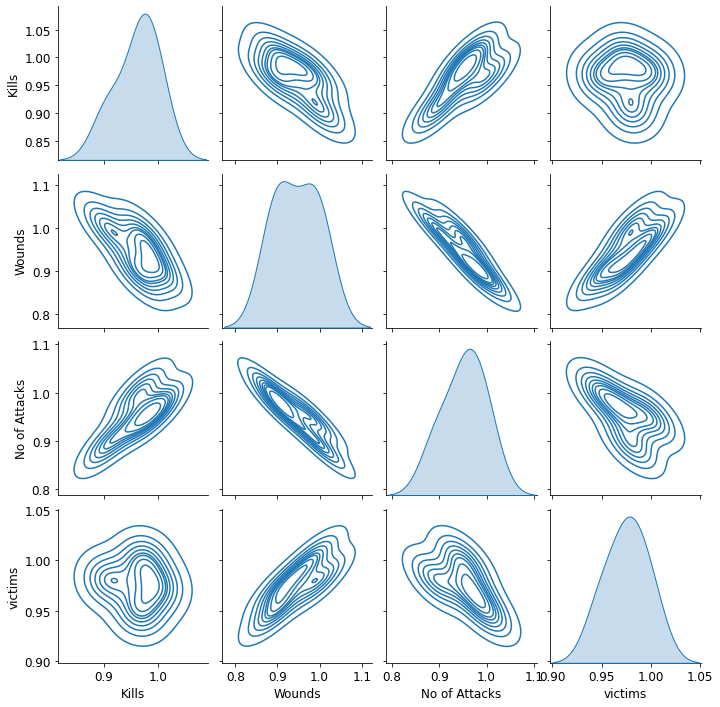

In [172]:
sns.pairplot(samp,kind='kde')

**Observations :**
1. Kills Vs Wounds are negatively corelated
2. Kills Vs No of Attacks were positively corelated

# **III. Multivariate Analysis**

## **8. Analysis of Region wise Attack type & Target Type**

In [173]:
fig6 = px.sunburst(gta,values='victims',
                   path=['Region','Attack_type','Target_type'],
                   color_discrete_sequence=px.colors.qualitative.Dark24,
                   title='Sunburst Chart: Grouping the Region wise Attack Type & Target types ')
fig6.show()

## **9. Analysis on Top 3 Organizations with respect to Region and Country on Sunburst chart**



In [174]:
fig7 = px.sunburst(gta_top3,values='victims',
                   path=['Gang_name','Region','Country'],
                   color_discrete_sequence=px.colors.qualitative.Dark24,
                   title='Sunburst Chart: Grouping the Top 3 gangs attacks with respect to region & Country')
fig7.show()

**Observations :**
1. Taliban's were most active in South Asia region and Afghanistan is the country which suffered most attacks by this group.
2. ISIL were most active in Middle East & North Africa region. Iraq, Syria and Turkey are the top 3 attacked countries by them.

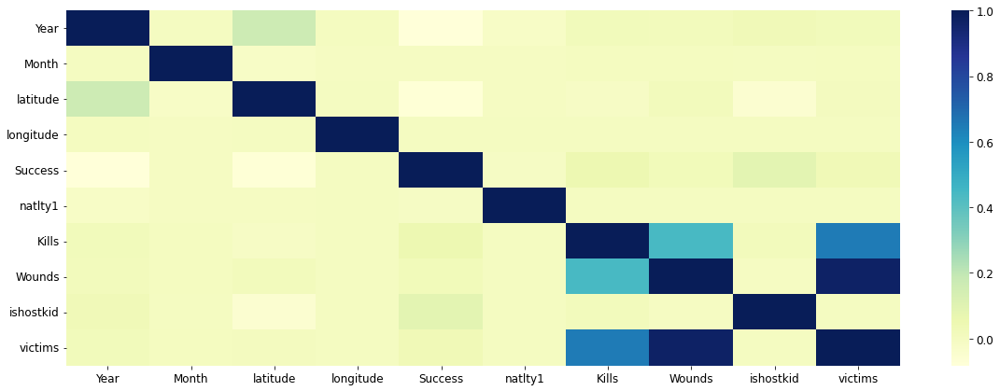

In [175]:
#df = gta.pivot_table(index='Year',columns='Country',values='Kills', aggfunc='sum')
df = gta.corr()
sns.heatmap(df,cmap="YlGnBu")

# **10.Analysis on Year wise No of Victims in different countries due to terrorist attacks**

In [176]:
fig4 = px.choropleth(gta,locations='Country',locationmode='country names',color='victims',animation_group='victims',
                     animation_frame='Year',labels={'victims': 'No of victims'},
                     title='No of Victims year wise in different Countries')
fig4.show()

# **11. Number of Terror Attacks in Different Countries from 1970-2014**

In [177]:
attacks_time_lapse = pd.DataFrame(gta.groupby(["Year" , "Country"])["Year"].count() , 
                                  columns = ["Year"]).rename(columns = {"Year" : "attacks"}).reset_index()

attacks_time_lapse_chorooleth = px.choropleth(attacks_time_lapse , locations = "Country" , locationmode = "country names" , 
              color = "attacks" , animation_group = "attacks" , 
              animation_frame = "Year" , labels={"attacks" : "Number of Attacks"} ,
              title = "Number of Terror Attacks in Different Countries from 1970-2014")
attacks_time_lapse_chorooleth.show()

# **12. Observations & Conclusions of EDA on Global Terrorism Analysis Dataset**

**Conclusions:**

1. Terrorist attacck's reached a peak during 2014 and then in 2015, started to drop. The drop in the number of terror attacks is not a sign of improvemnet in security checks in the society, as the ability to carry out a successful terror attack has not reduced significantly.
2. The middle East & North Africa is the most affected region in terms of the number of terror attacks among all the regions followed by South Asia, South America and Sub-Saharan Africa.
3. Iraq is the most affected nation of all and it has suffered the highest number of attacks followed by Pakistan, Afganistan and India. 
4. Most of the attacks are either bombing or explosions followed by firearms and the most used weapons in the terror attacks are explosives and assault weapons.
5. Taliban and ISIL are the most active terrorist organisations in the world and Afghanistan is the country that has suffered the most because of Taliban's.
6. In 2016, India suffered the highest number of attacks, which was peaked during Aug-2016. Most attacks were happened in Srinagar (Jammu & Kashmir). Maoists were responsible for most of the attcaks.
7. Terrorist organisations and attacks are slowly moving to underdeveloped and developing countries with large populations below the poverty level in south Asia and Africa.
8. This creates a cycle of terrorism as poverty and unemployment help radical ideologists lure youth towards terrorism, discouraging investors which in turn effects the earnings of local governments and leads to further poverty and unemployment.

**Mitigation Measures:**

1. Defining terrorism on a global stage and adopting an international framework to tackle terrorism.
2. Creating a joint task forcce to improve intelligence sharing and sharing the best practices to combat
terrorism.
3. Countries should take measures against illegal immigration by implementing better tracking systems.
4. By imposing strict regulations on the access and sale of dangerous weapons and firearms and tracking sources of such weapons.
5. Adopting a global framework and implementing a tough action plan against terror financiers.
6. Education in population control and improving conditions to encourage employment oppurtunities might reduce terror activities in the long run.
7. Strict policies against disinformation and radicalization need to be adopted, including media & internet.